**Web Resources for Cell Type Annotation**

https://www.10xgenomics.com/resources/analysis-guides/web-resources-for-cell-type-annotation

[CellMarker 2.0](http://bio-bigdata.hrbmu.edu.cn/CellMarker/)

In [1]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scarches as sca
import urllib.request

In order to use the mouse gastrulation seqFISH datsets, please install squidpy (see https://github.com/scverse/squidpy).
Created a temporary directory at /tmp/tmpr4100dar
Writing /tmp/tmpr4100dar/_remote_module_non_scriptable.py
In order to use sagenet models, please install pytorch geometric (see https://pytorch-geometric.readthedocs.io) and 
 captum (see https://github.com/pytorch/captum).
mvTCR is not installed. To use mvTCR models, please install it first using "pip install mvtcr"
multigrate is not installed. To use multigrate models, please install it first using "pip install multigrate".


In [3]:
# TODO: learn more about `celltypist`, `scarches`

In [4]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [5]:
sc.set_figure_params(figsize=(5, 5))

In [6]:
adata = sc.read(
    filename="dataset/s4d8_clustered.h5ad",
    # backup_url="https://figshare.com/ndownloader/files/41436666",
)

# Manual annotation

## From markers to cluster annotation

In [7]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [8]:
# keep only the genes that we find in our adata object as markers for that cell type
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [9]:
# construct that UMAP here based on the scran-normalized count data, using only the highly deviant genes

adata.layers["counts"] = adata.X
adata.X = adata.layers["scran_normalization"]

adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [10]:
#  We’ll limit ourselves to B/plasma cell subtypes for this example
#  three negative markers in our list: IGHD and IGHM for B1 B, and PAX5 for plasmablasts
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

NAIVE CD20+ B:


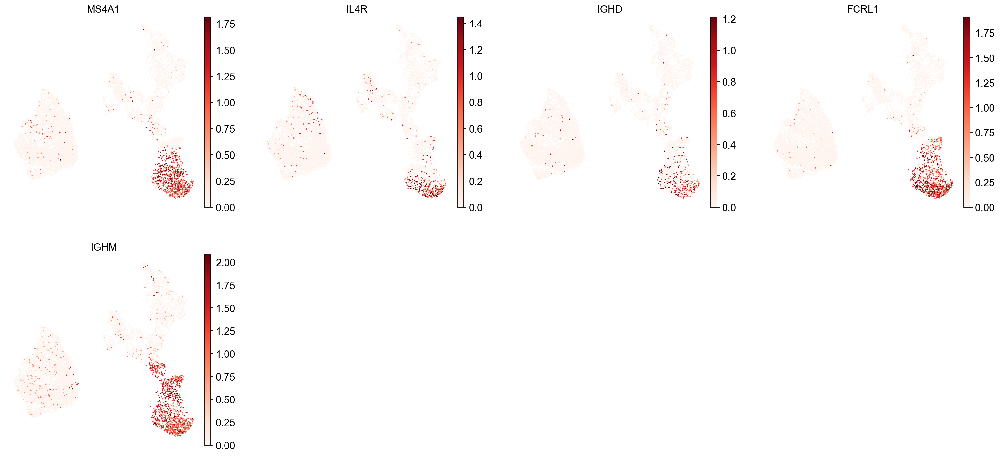





B1 B:


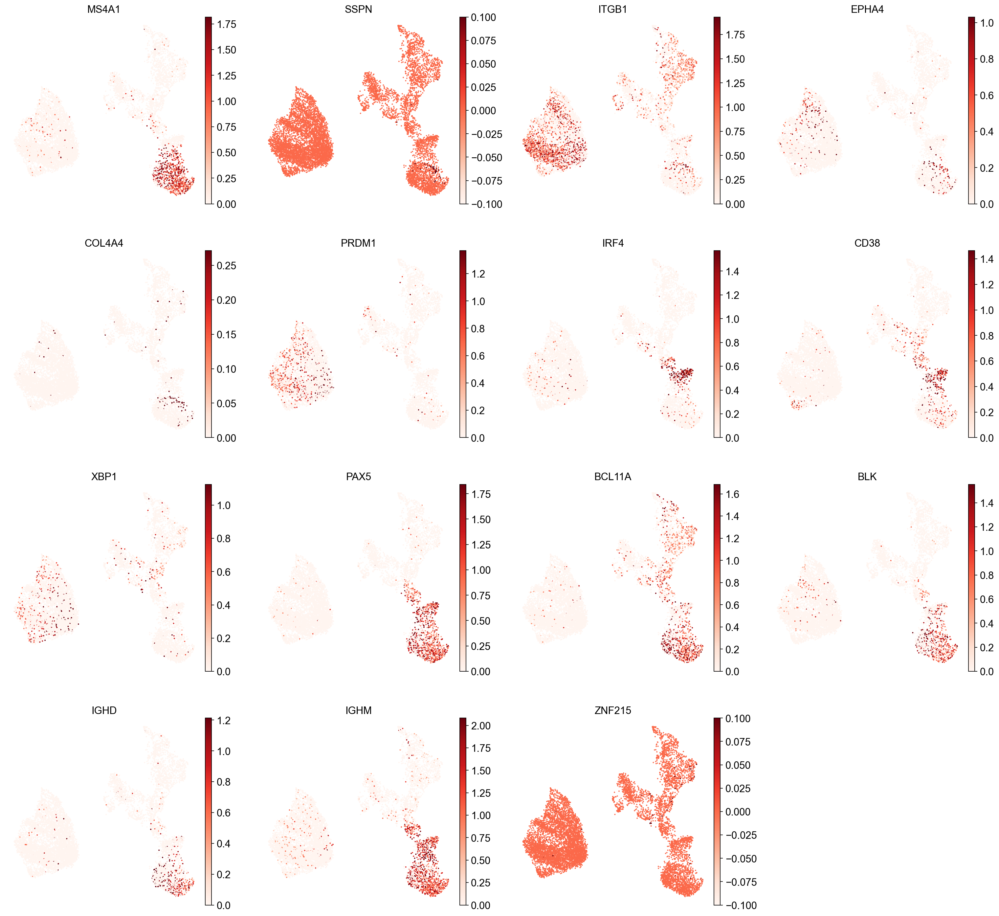





TRANSITIONAL B:


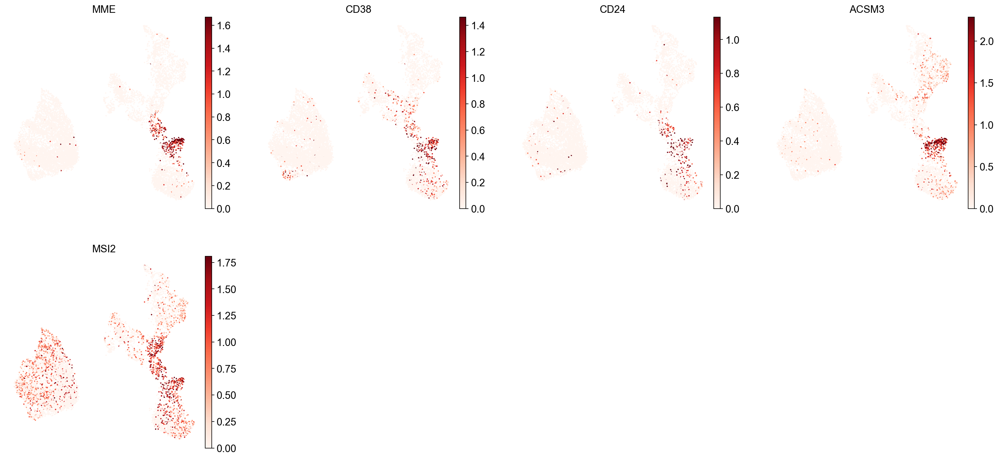





PLASMA CELLS:


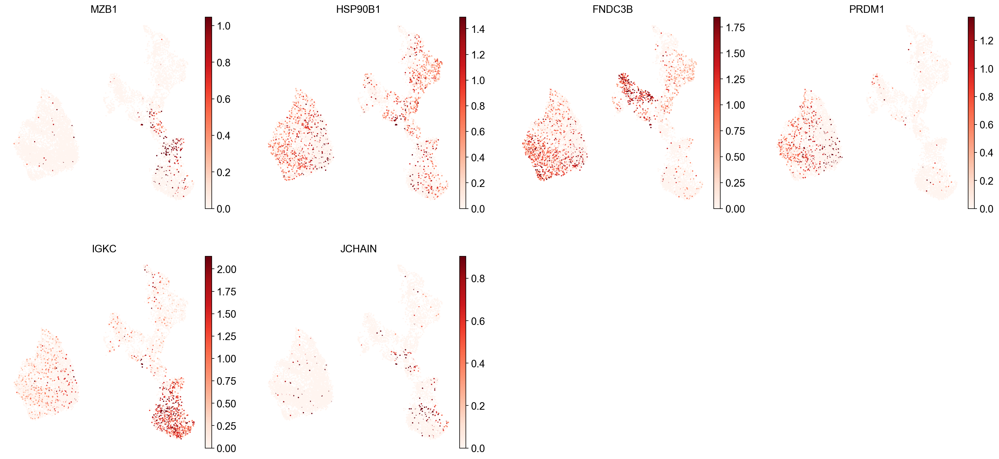





PLASMABLAST:


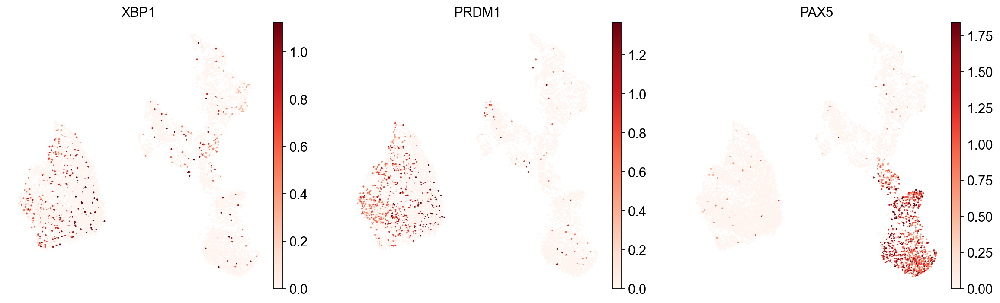

In [11]:
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

**Note:**

As you can see, even markers for a single cell type are often expressed in different subsets of the data, i.e. individual markers are often not uniquely expressed in a single cell type. Rather, it is the intersection of those subsets that will tell you where your cell type of interest is.

We can then annotate those clusters based on their overall marker expression patterns.

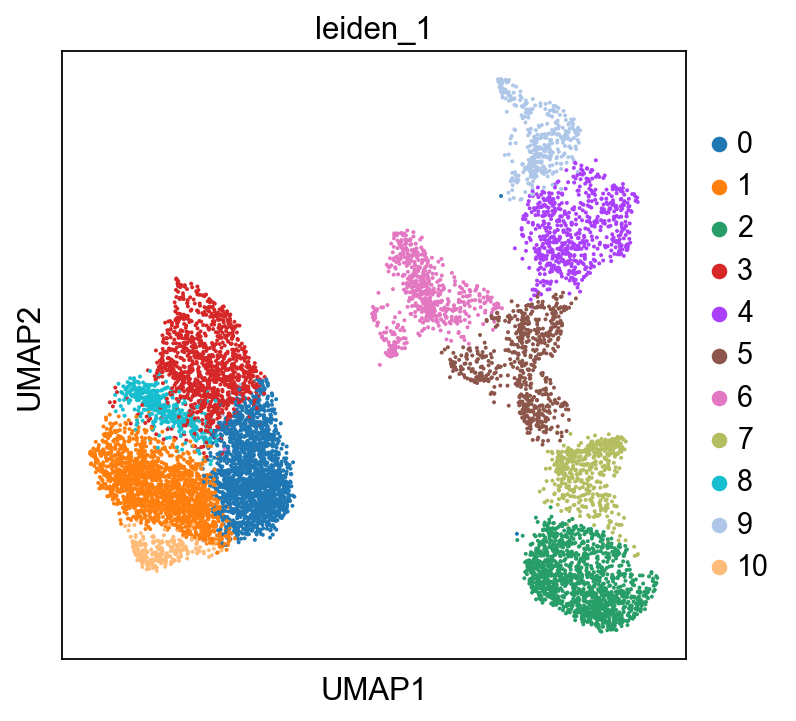

In [12]:
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")
sc.pl.umap(adata, color="leiden_1")

You might notice that this partitioning of the data is rather coarse and some of the marker expression patterns we saw above are not captured by this clustering. We can therefore try a higher resolution clustering by changing the resolution parameter of our clustering:

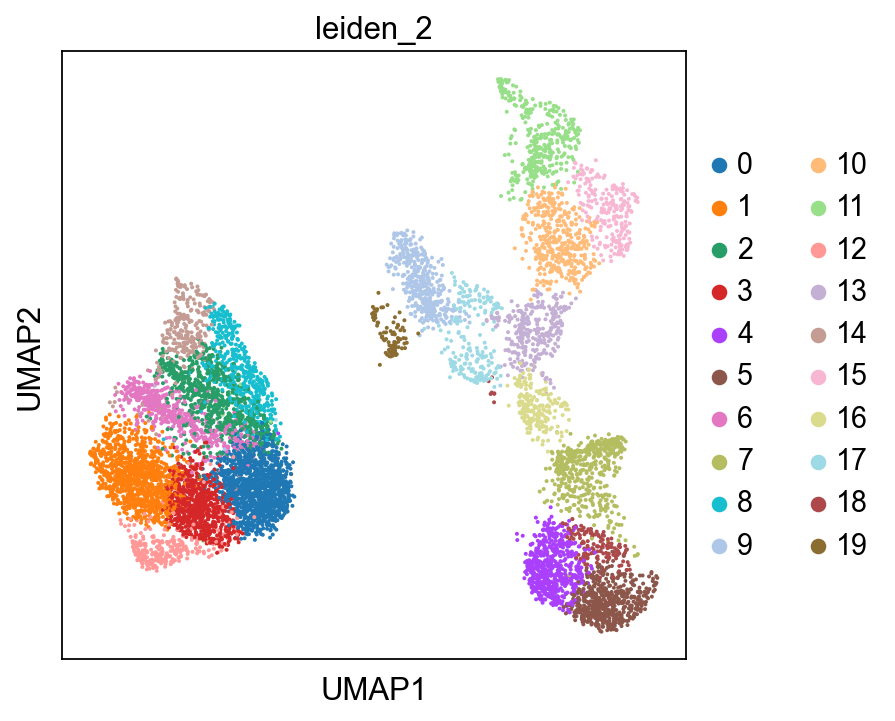

In [13]:
sc.tl.leiden(adata, resolution=2, key_added="leiden_2")
sc.pl.umap(adata, color="leiden_2")

In [14]:
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}

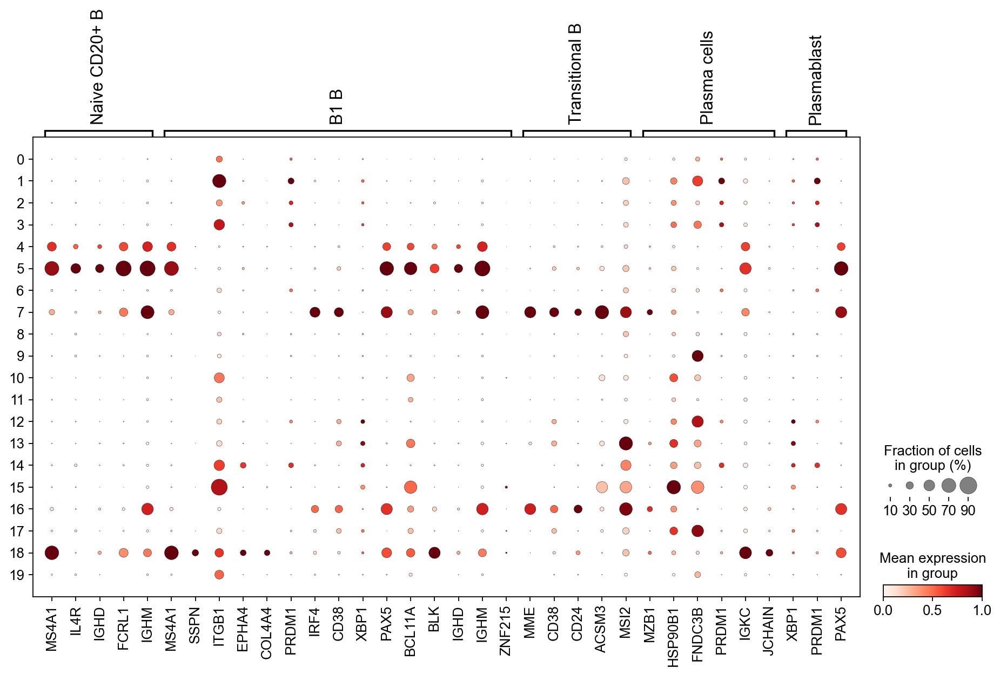

In [15]:
# visualize this using a dotplot

sc.pl.dotplot(
    adata,
    groupby="leiden_2",
    var_names=B_plasma_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [16]:
cl_annotation = {
    "4": "Naive CD20+ B",
    "5": "Naive CD20+ B",
    "7": "Transitional B",
    "18": "B1 B",  # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
}

You might notice that the annotation of B1 B cells is difficult, with none of the clusters expressing all the B1 B markers and several clusters expressing some of the markers. We often see that markers that work for one dataset do not work as well for others. This can be due to differences in sequencing depth, but also due to other sources of variation between datasets or samples

In [17]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

... storing 'manual_celltype_annotation' as categorical


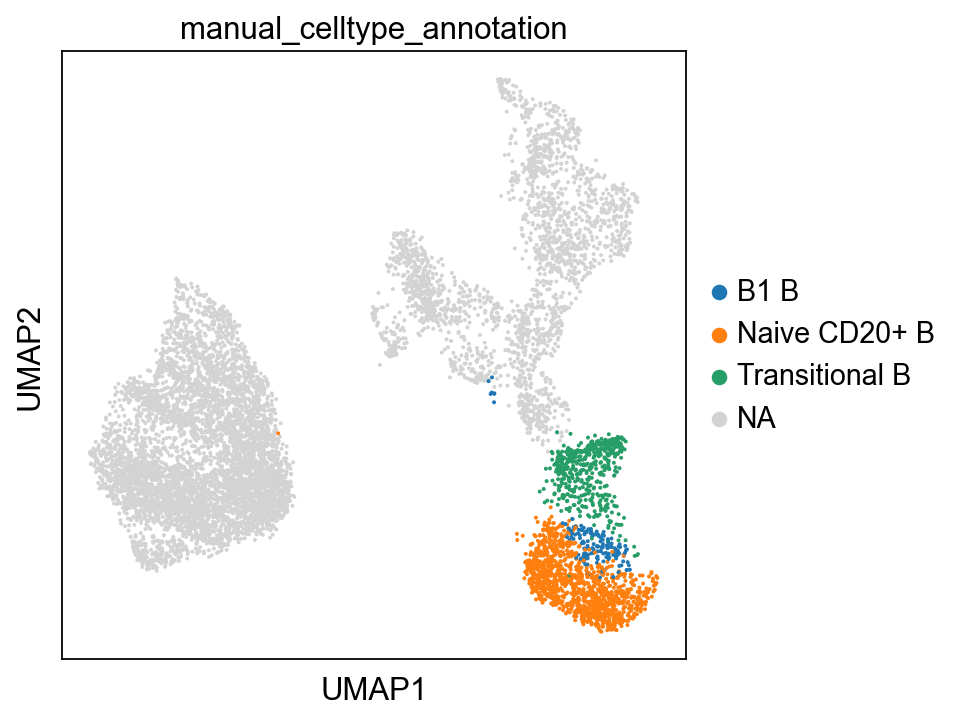

In [18]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

## From cluster differentially expressed genes to cluster annotation

For marker gene calculation of clusters simple methods such as the Wilcoxon rank-sum test are thought to perform best

Calculate the differentially expressed genes for every cluster, compared to the rest of the cells in our adata:

In [19]:
sc.tl.rank_genes_groups(
    adata, groupby="leiden_2", method="wilcoxon", key_added="dea_leiden_2"
)

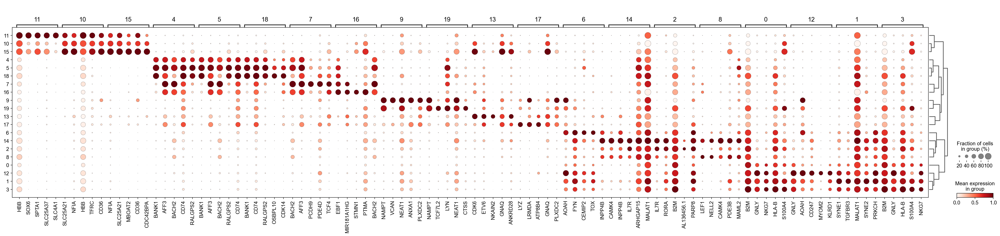

In [20]:
# We can visualize expression of the top differentially expressed genes per cluster
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_2", standard_scale="var", n_genes=5, key="dea_leiden_2"
)

In [21]:
# Filter the differentially expressed genes to select for more cluster-specific differentially expressed genes:

sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_2",
    key_added="dea_leiden_2_filtered",
)

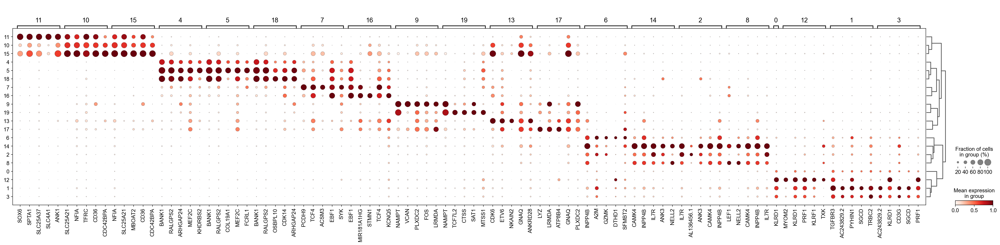

In [22]:
# Visualize the filtered genes

sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_2",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_2_filtered",
)

In [23]:
adata

AnnData object with n_obs × n_vars = 9370 × 31208
    obs: 'site', 'donor', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'batch', 'size_factors', 'leiden_1', 'leiden_2', 'manual_celltype_annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'highly_variable'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'manual_celltype_annotation_colors', 'dea_leiden_2', 'dendrogram_leiden_2', 'dea_leiden_2_filtered'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scran_normalizati

In [24]:
adata.uns['dea_leiden_2_filtered']['names']

rec.array([(nan, nan, 'IL7R', nan, 'BANK1', 'BANK1', nan, nan, 'LEF1', 'NAMPT', 'SLC25A21', nan, nan, 'CDK6', 'CAMK4', 'NFIA', 'EBF1', 'LYZ', 'BANK1', 'NAMPT'),
           (nan, 'TGFBR3', nan, nan, nan, nan, nan, nan, 'NELL2', 'VCAN', 'NFIA', 'SOX6', nan, 'ETV6', 'INPP4B', 'SLC25A21', 'MIR181A1HG', 'LRMDA', nan, 'TCF7L2'),
           (nan, nan, nan, nan, nan, nan, nan, 'PCDH9', 'CAMK4', nan, nan, 'SPTA1', nan, 'NKAIN2', 'IL7R', 'MBOAT2', 'STMN1', 'ATP8B4', 'RALGPS2', nan),
           (nan, nan, 'AL136456.1', nan, nan, 'RALGPS2', nan, nan, nan, nan, 'TFRC', 'SLC25A37', 'MYOM2', 'GNAQ', nan, 'CD36', nan, 'GNAQ', 'OSBPL10', nan),
           (nan, nan, nan, nan, 'RALGPS2', nan, 'INPP4B', 'TCF4', nan, 'PLXDC2', 'CD36', 'SLC4A1', 'KLRD1', 'ANKRD28', nan, 'CDC42BPA', nan, 'PLXDC2', 'CDK14', 'CTSS'),
           (nan, nan, 'ANK3', nan, 'ARHGAP24', nan, nan, nan, 'INPP4B', nan, 'CDC42BPA', 'ANK1', nan, 'ZNF385D', nan, 'ANK1', nan, 'NEGR1', 'ARHGAP24', nan),
           (nan, nan, nan, nan, 'MEF2C

In [25]:
len(adata.uns['dea_leiden_2_filtered']['names'])

31208

Let’s take a look at cluster 13, which seems to have a set of relatively unique markers including CDK6, ETV6, NKAIN2, and GNAQ. Some googling tells us that NKAIN2 and ETV6 are hematopoietic stem cell markers

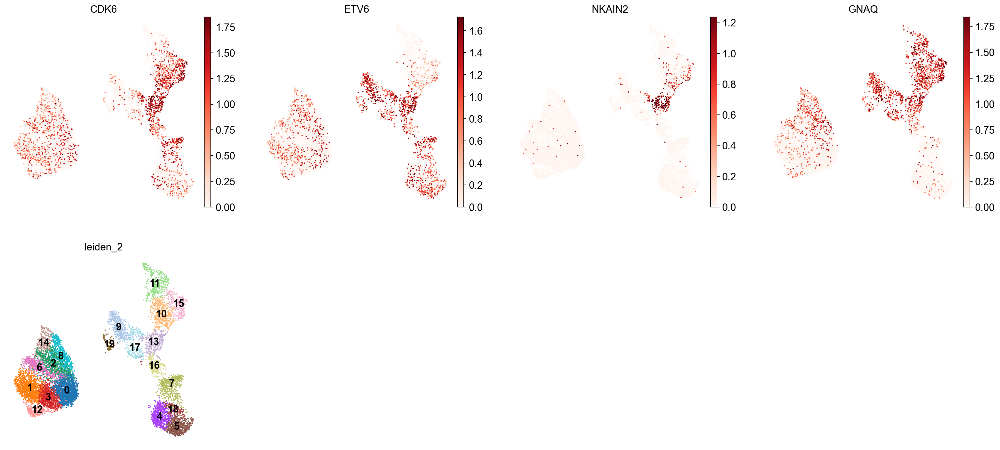

In [26]:
sc.pl.umap(
    adata,
    color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_2"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

However, looking at the known markers for the megakaryocyte/erythrocyte progenitors (“MK/E prog”), we see that part of cluster 13 seems to belong to that cell type:

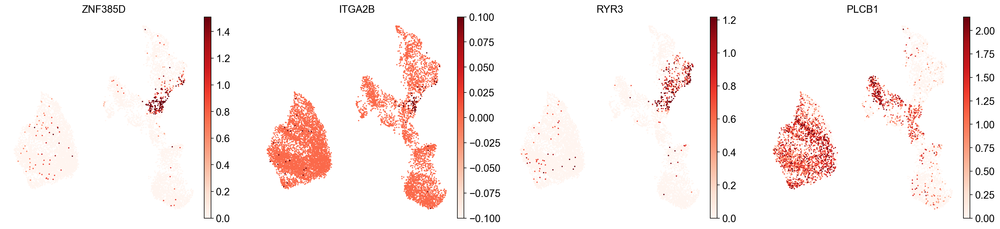

In [27]:
sc.pl.umap(
    adata,
    color=[
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

This highlights how complicated marker-based annotation is: it is sensitive to the cluster resolution you choose, the robustness and uniqueness of the marker sets you have, and your knowledge of the cell types to be expected in your data.

For this reason, the field is partly trying to move away from manual cluster annotation and rather moving towards automated annotation algorithms instead. The rest of this tutorial will focus on those options.

Before we move on, store the final bit of annotation information in our adata:

In [28]:
cl_annotation["13"] = "HSCs + MK/E prog (?)"

In [29]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

# Automated annotation

It is therefore important to regard these methods as a starting point rather than an end-point of the annotation process

## Marker gene-based classifiers

One class of automated cell type annotation methods relies on a predefined set of marker genes. Cells are classified into cell types based on their expression levels of these marker genes. Examples of such methods are Garnett [Pliner et al., 2019] and CellAssign [Zhang et al., 2019].

- Garnett (https://cole-trapnell-lab.github.io/garnett) 

- CellAssign (https://github.com/irrationone/cellassign)

The more robust and generalizable the set of marker genes these models are based on, the better the model will perform. However, like with other models they are likely to be affected by batch effect-related differences between the data the model was trained on and the data that needs to be labeled. One of the advantages of these methods compared to models based on larger gene sets (see below) is that they are more transparent: we know on the basis of which genes the classification is done.

## Classifiers based on a wider set of genes

In [30]:
# To use CellTypist, we need to prepare our data so that counts are normalized to 10,000 counts per cell, then log1p-transformed

adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [31]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 43
📂 Storing models in /home/mowp/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [32]:
# Let’s try out both the Immune_All_Low and Immune_All_High models (these annotate immune cell types finer annotation level (low) and coarser (high))
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [33]:
model_high

CellTypist model with 32 cell types and 6639 features
    date: 2022-07-16 08:53:00.959521
    details: immune populations combined from 20 tissues of 18 studies
    source: https://doi.org/10.1126/science.abl5197
    version: v2
    cell types: B cells, B-cell lineage, ..., pDC precursor
    features: A1BG, A2M, ..., ZYX

In [34]:
# For each of these, we can see which cell types it includes to see if bone marrow cell types are included:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [35]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

First the coarse model

In [36]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [37]:
predictions_high_adata = predictions_high.to_adata()

In [38]:
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

Now the same for the finer annotations

In [39]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [40]:
predictions_low_adata = predictions_low.to_adata()

In [41]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

Plotting the cell type predictions:

... storing 'manual_celltype_annotation' as categorical


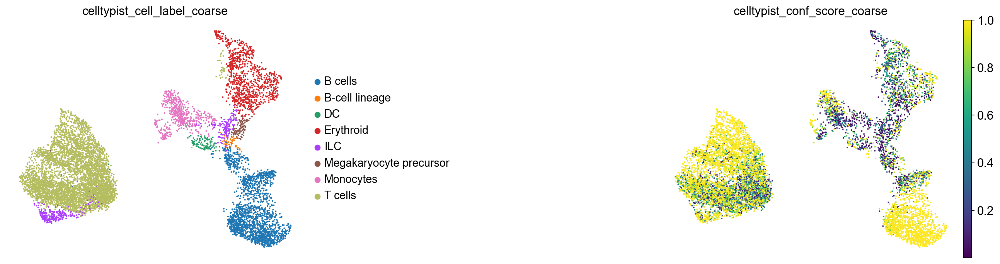

In [42]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

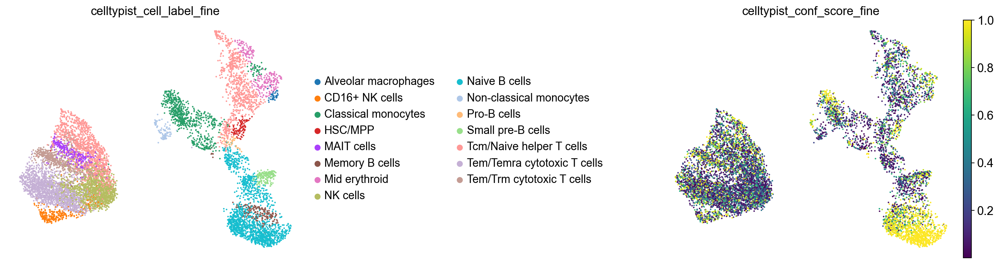

In [43]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

One way of getting a feeling for the quality of these annotations is by looking if the observed cell type similarities correspond to our expectations:

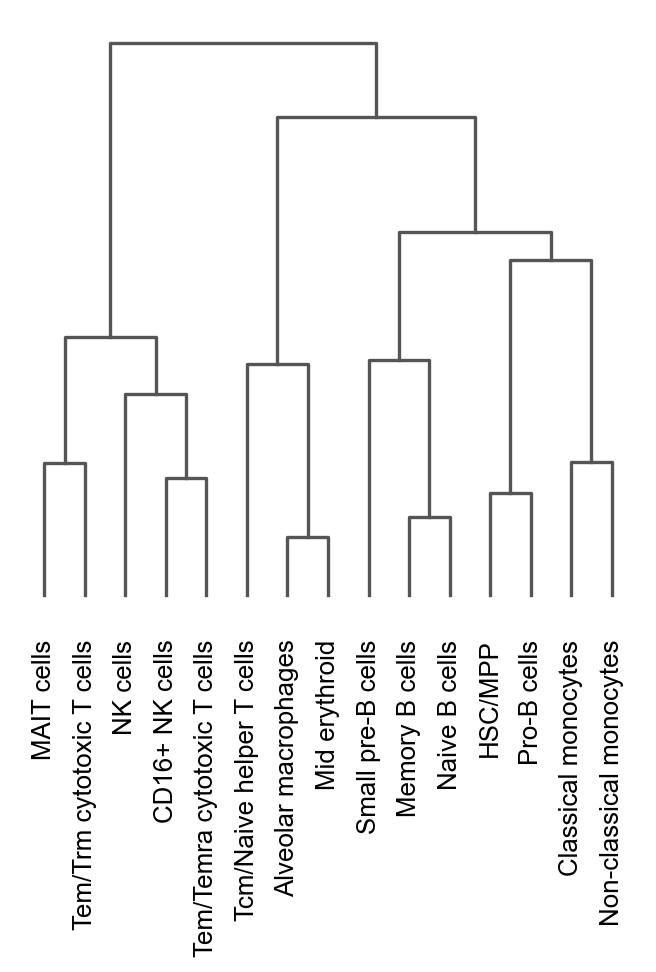

<AxesSubplot: >

In [44]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

This dendrogram partly reflects prior knowledge on cell type relations (e.g. B cells largely clustering together), but we also observe some **unexpected patterns**: Tcm/Naive helper T cells cluster with erythroid cells and macrophages rather than with the other T cells. This is a red flag! Possibly, the Tcm/Naive helper T cell annotation are wrong.

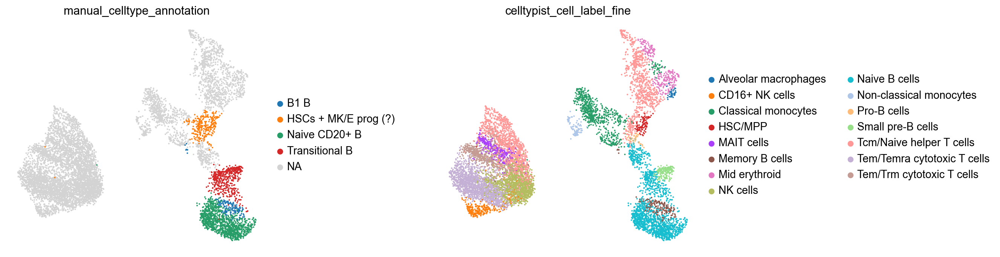

In [45]:
sc.pl.umap(
    adata,
    color=["manual_celltype_annotation", 'celltypist_cell_label_fine'],
    frameon=False,
    wspace=.5,
)

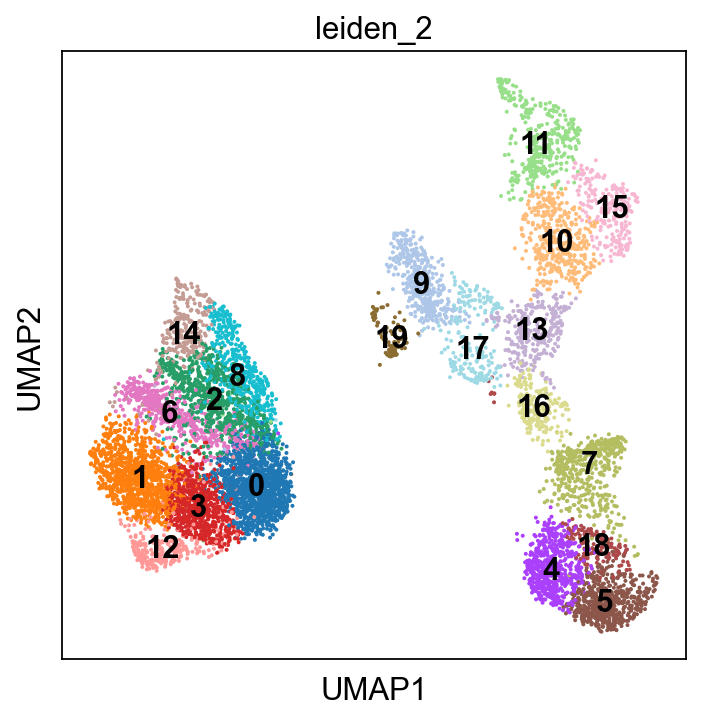

In [46]:
sc.pl.umap(adata, color="leiden_2", legend_loc="on data")

In [47]:
# See here the breakdown of cluster 13 in terms of fine celltypist labels:
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_fine).loc[
    "13", :
].sort_values(ascending=False)

celltypist_cell_label_fine
Tcm/Naive helper T cells       124
HSC/MPP                         97
Pro-B cells                     40
Classical monocytes             30
Naive B cells                    1
Tem/Temra cytotoxic T cells      1
Alveolar macrophages             0
CD16+ NK cells                   0
MAIT cells                       0
Memory B cells                   0
Mid erythroid                    0
NK cells                         0
Non-classical monocytes          0
Small pre-B cells                0
Tem/Trm cytotoxic T cells        0
Name: 13, dtype: int64

In [48]:
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_coarse).loc[
    "13", :
].sort_values(ascending=False)

celltypist_cell_label_coarse
ILC                        143
Megakaryocyte precursor     97
B-cell lineage              40
Erythroid                    8
Monocytes                    3
B cells                      1
T cells                      1
DC                           0
Name: 13, dtype: int64

This underlines that automated annotation algorithms should be used with caution and should be regarded as a starting point for annotating your data, rather than as a final annotation. 

**Ultimately, expression of known marker genes is still the most accepted support for a cell type annotation.**

To highlight this, let’s look at a marker for the eryhtroid lineage: hemoglobulin B. Most likely the cells annotated as “Tcm/Naive helper T” (already flagged as possibly wrongly annotated based on the dendrogram above) are from the erythroid lineage!

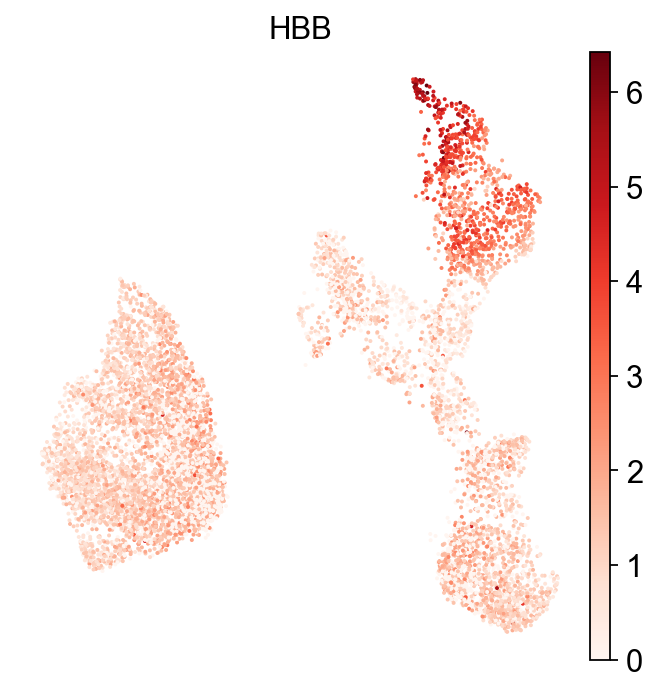

In [49]:
sc.pl.umap(adata, color="HBB", cmap="Reds", frameon=False, sort_order=False)

## Annotation by mapping to a reference

scArches, the method that enables us to adapt an existing reference model to new data requires raw, non-normalized counts

In [50]:
adata_to_map = adata.copy()
for layer in list(adata_to_map.layers.keys()):
    if layer != "counts":
        del adata_to_map.layers[layer]
adata_to_map.X = adata_to_map.layers["counts"]

Moreover, it is important that we use the same input features (i.e. genes) as were used for training our reference model and that we put those features in the same order. The reference model’s feature information is stored together with the model. Let’s load the feature table.

In [51]:
reference_model_features = pd.read_csv(
    "https://figshare.com/ndownloader/files/41436645", index_col=0
)

In [52]:
reference_model_features

,gene_ids
LINC01128,ENSG00000228794
HES4,ENSG00000188290
ISG15,ENSG00000187608
LINC01342,ENSG00000223823
TNFRSF18,ENSG00000186891
...,...
AC009494.2,ENSG00000286247
RPS4Y2,ENSG00000280969
AL592183.1,ENSG00000273748
AC233755.2,ENSG00000277856


The table has both gene names and gene ids. As gene ids are usually less subject to change over genome annotation versions, we will use those to subset our data. We will therefore set our row names for both our adata and the reference model features to gene_ids. Importantly, we have to make sure to also store the gene names for later use: these are much easier to understand than the gene ids.

In [53]:
adata_to_map.var["gene_names"] = adata_to_map.var.index
adata_to_map.var.set_index("gene_ids", inplace=True)

In [54]:
reference_model_features["gene_names"] = reference_model_features.index
reference_model_features.set_index("gene_ids", inplace=True)

In [55]:
# check if we have all the genes we need in our query data

print("Total number of genes needed for mapping:", reference_model_features.shape[0])

Total number of genes needed for mapping: 4000


In [56]:
print(
    "Number of genes found in query dataset:",
    adata_to_map.var.index.isin(reference_model_features.index).sum(),
)

Number of genes found in query dataset: 3998


In [57]:
# manually add those and set their counts to 0, as it seems like these genes were not detected in our data.

missing_genes = [
    gene_id
    for gene_id in reference_model_features.index
    if gene_id not in adata_to_map.var.index
]

In [58]:
missing_genes

['ENSG00000224000', 'ENSG00000236663']

In [59]:
missing_gene_adata = sc.AnnData(
    X=csr_matrix(np.zeros(shape=(adata.n_obs, len(missing_genes))), dtype="float32"),
    obs=adata.obs.iloc[:, :1],
    var=reference_model_features.loc[missing_genes, :],
)
missing_gene_adata.layers["counts"] = missing_gene_adata.X

In [60]:
# 构建了一个包含所有缺失基因的 AnnData 对象，其 counts 层中的所有值都为 0
missing_gene_adata

AnnData object with n_obs × n_vars = 9370 × 2
    obs: 'site'
    var: 'gene_names'
    layers: 'counts'

In [61]:
# remove the PCA matrix from varm

if "PCs" in adata_to_map.varm.keys():
    del adata_to_map.varm["PCs"]

In [62]:
adata_to_map_augmented = sc.concat(
    [adata_to_map, missing_gene_adata],
    axis=1,
    join="outer",
    index_unique=None,
    merge="unique",
)

In [63]:
adata_to_map_augmented

AnnData object with n_obs × n_vars = 9370 × 31210
    obs: 'site', 'donor', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'batch', 'size_factors', 'leiden_1', 'leiden_2', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'highly_variable', 'gene_names'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [64]:
# subset to the genes used in the model and order correctly:

adata_to_map_augmented = adata_to_map_augmented[
    :, reference_model_features.index
].copy()

In [65]:
adata_to_map_augmented

AnnData object with n_obs × n_vars = 9370 × 4000
    obs: 'site', 'donor', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'batch', 'size_factors', 'leiden_1', 'leiden_2', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'highly_variable', 'gene_names'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [66]:
# Check if our adata gene names correspond exactly to the required gene order:

(adata_to_map_augmented.var.index == reference_model_features.index).all()

True

In [67]:
#  set the gene indices back to gene names for easy interpretation:

adata_to_map_augmented.var["gene_ids"] = adata_to_map_augmented.var.index
adata_to_map_augmented.var.set_index("gene_names", inplace=True)

In [68]:
#  Finally, this reference model used adata.obs[‘batch’] as our batch variable. 
#  We will therefore check that we have this set to one value for our entire sample:
adata_to_map_augmented.obs.batch.unique()

['12']
Categories (1, object): ['12']

The better our reference model, the better our label transfer will perform

The reference model is an scvi-model (used for data integration) that generates a low-dimensional, integrated embedding of the input data, see also the scvi-publication

**Note that this is a toy model generated for this tutorial and it should not be used in other contexts**

In [69]:
# loading model.pt from figshare
if not os.path.exists("./reference_model"):
    os.mkdir("./reference_model")
elif not os.path.exists("./reference_model/model.pt"):
    urllib.request.urlretrieve(
        "https://figshare.com/ndownloader/files/41436648",
        filename="reference_model/model.pt",
    )

In [71]:
scarches_model = sca.models.SCVI.load_query_data(
    adata=adata_to_map_augmented,
    reference_model="./reference_model",
    freeze_dropout=True,
)

INFO     File ./reference_model/model.pt already downloaded                                                        


In [72]:
scarches_model.train(max_epochs=500, plan_kwargs=dict(weight_decay=0.0))

INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs


INFO: You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [06:58<00:00,  1.14it/s, v_num=1, train_loss_step=664, train_loss_epoch=653]

INFO: `Trainer.fit` stopped: `max_epochs=500` reached.
`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|██████████| 500/500 [06:58<00:00,  1.20it/s, v_num=1, train_loss_step=664, train_loss_epoch=653]


In [73]:
adata.obsm["X_scVI"] = scarches_model.get_latent_representation()

In [74]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

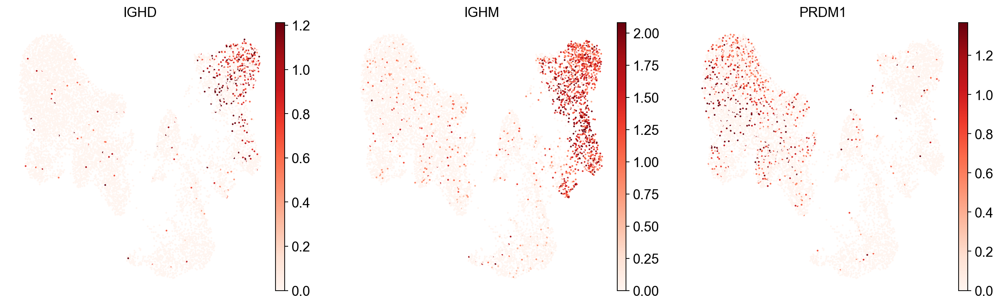

In [75]:
# To see if the mapping-based UMAP makes general sense, let’s look at a few markers and if their expression is localized to specific parts of the UMAP:

sc.pl.umap(
    adata,
    color=["IGHD", "IGHM", "PRDM1"],
    vmin=0,
    vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
    sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
    frameon=False,
    cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
)

In [76]:
# combine the inferred latent space embedding of our query data with the existing reference embedding

ref_emb = sc.read(
    filename="dataset/reference_embedding.h5ad",
    # backup_url="https://figshare.com/ndownloader/files/41376264",
)

In [77]:
ref_emb.obs["reference_or_query"] = "reference"

In [78]:
ref_emb
# As you can see it has only 10 dimensions (in .X) which together represent the latent space embedding of the reference cells. 
# Our query embedding that we calculated for our own data also has 10 dimensions. The 10 dimensions of the reference and query are the same and can be combined!

AnnData object with n_obs × n_vars = 86332 × 10
    obs: 'donor', 'batch', 'site', 'cell_type', 'reference_or_query'
    uns: 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

In [79]:
adata.obsm["X_scVI"].shape

(9370, 10)

In [80]:
adata_emb = sc.AnnData(X=adata.obsm["X_scVI"], obs=adata.obs)

In [81]:
adata_emb.obs["reference_or_query"] = "query"

In [82]:
emb_ref_query = sc.concat(
    [ref_emb, adata_emb],
    axis=0,
    join="outer",
    index_unique=None,
    merge="unique",
)

In [83]:
emb_ref_query

AnnData object with n_obs × n_vars = 95702 × 10
    obs: 'donor', 'batch', 'site', 'cell_type', 'reference_or_query', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'size_factors', 'leiden_1', 'leiden_2', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    obsm: 'X_umap'

In [84]:
# Let’s visualize the joint embedding with a UMAP

sc.pp.neighbors(emb_ref_query)
sc.tl.umap(emb_ref_query)

... storing 'reference_or_query' as categorical


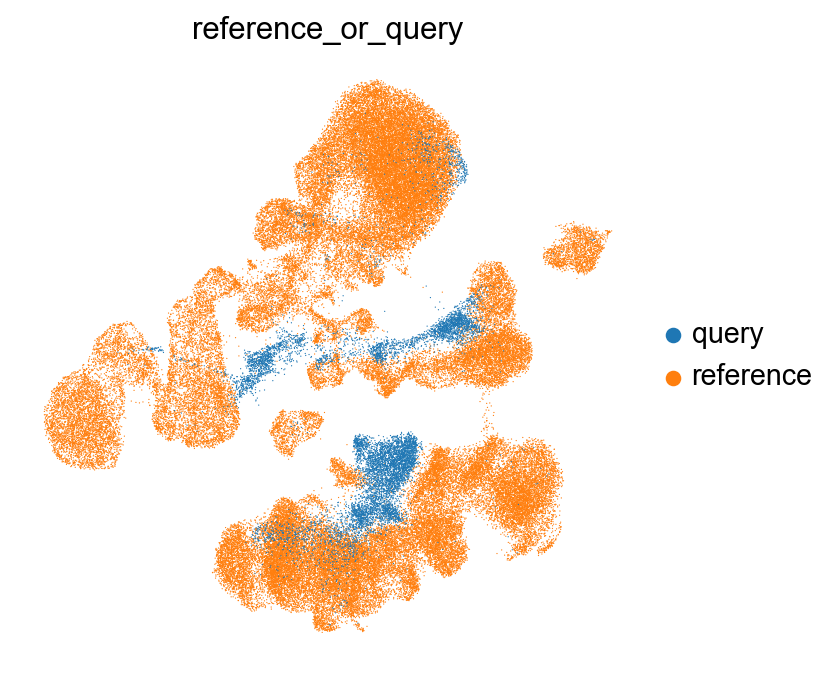

In [85]:
sc.pl.umap(
    emb_ref_query,
    color=["reference_or_query"],
    sort_order=False,
    frameon=False,
)

The (partial) mixing of query and reference in this UMAP is a good sign! When mapping completely fails, you will often see a full separation of query and reference in the UMAP.

In [86]:
sc.set_figure_params(figsize=(8, 8))

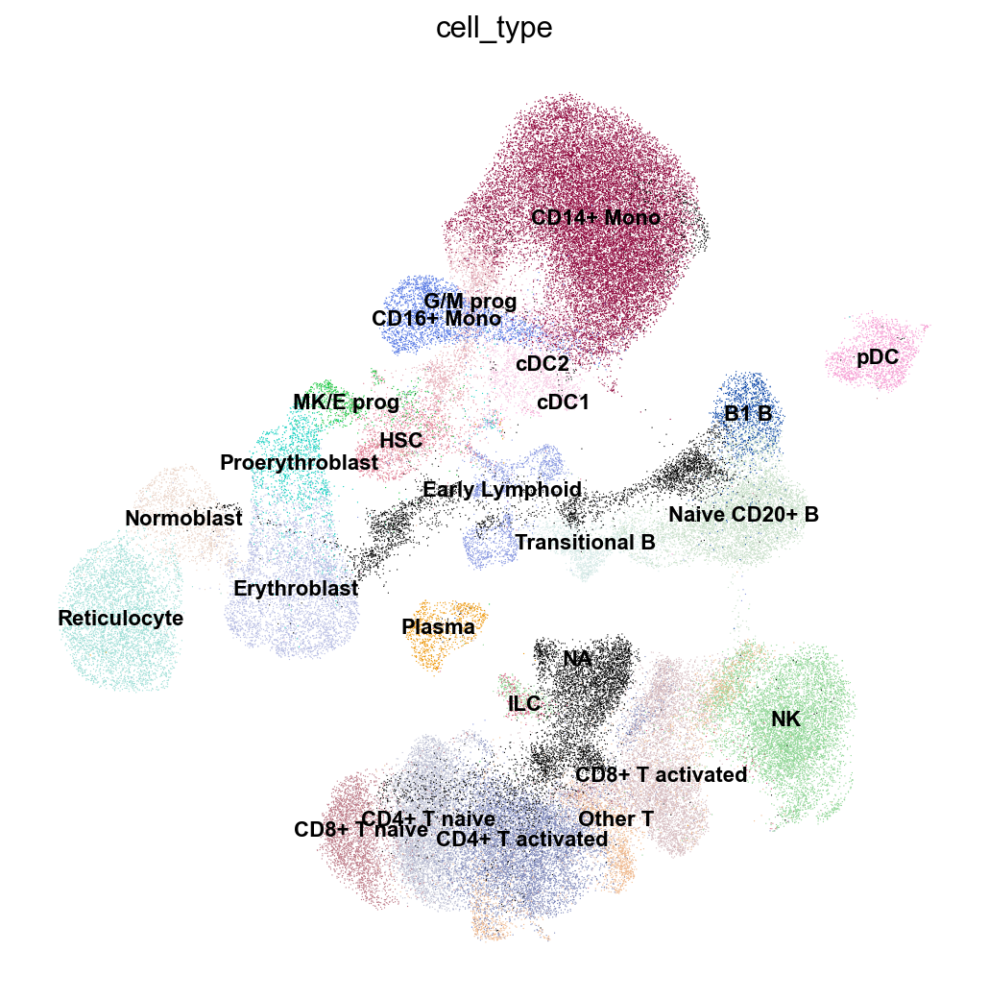

In [87]:
sc.pl.umap(
    emb_ref_query,
    color=["cell_type"],
    sort_order=False,
    frameon=False,
    legend_loc="on data",
    legend_fontsize=10,
    na_color="black",
)

In [88]:
#  Guess the cell type of each of our own cells (in black) by looking at which cell types from the reference surround it
#  by nearest-neighbor-graph-based label transfer approach

knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata=ref_emb,
    train_adata_emb="X",  # location of our joint embedding
    n_neighbors=15,
)

Weighted KNN with n_neighbors = 15 ... 

In [89]:
#  perform the label transfer

labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=adata_emb,
    query_adata_emb="X",  # location of our embedding, query_adata.X in this case
    label_keys="cell_type",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=ref_emb.obs,
)

finished!


In [90]:
adata_emb.obs["transf_cell_type"] = labels.loc[adata_emb.obs.index, "cell_type"]
adata_emb.obs["transf_cell_type_unc"] = uncert.loc[adata_emb.obs.index, "cell_type"]

In [91]:
adata.obs.loc[adata_emb.obs.index, "transf_cell_type"] = adata_emb.obs[
    "transf_cell_type"
]
adata.obs.loc[adata_emb.obs.index, "transf_cell_type_unc"] = adata_emb.obs[
    "transf_cell_type_unc"
]

In [92]:
sc.set_figure_params(figsize=(5, 5))

... storing 'transf_cell_type' as categorical


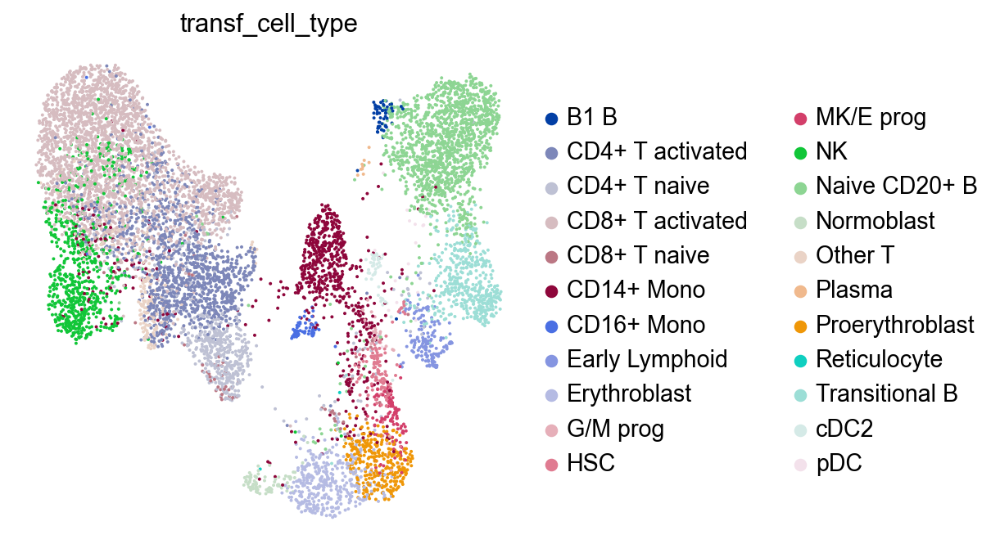

In [93]:
sc.pl.umap(adata, color="transf_cell_type", frameon=False)

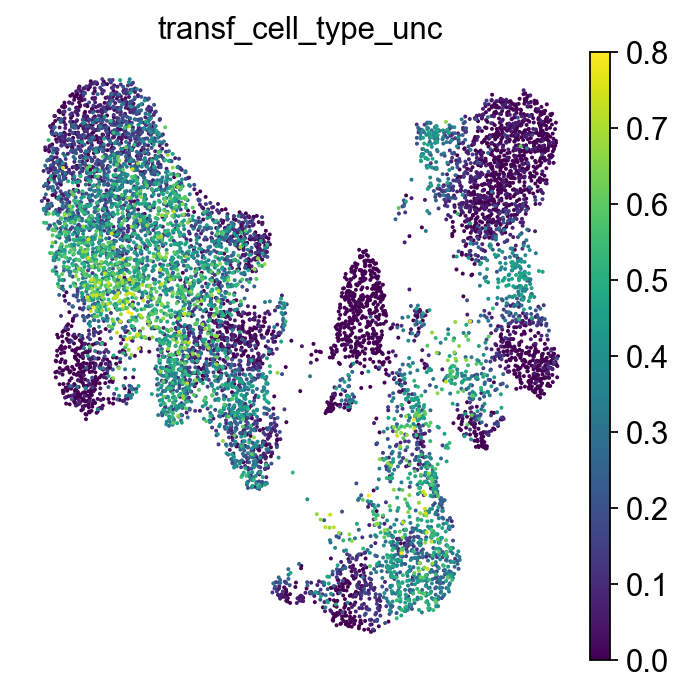

In [94]:
sc.pl.umap(adata, color="transf_cell_type_unc", frameon=False)  # uncertainty scores

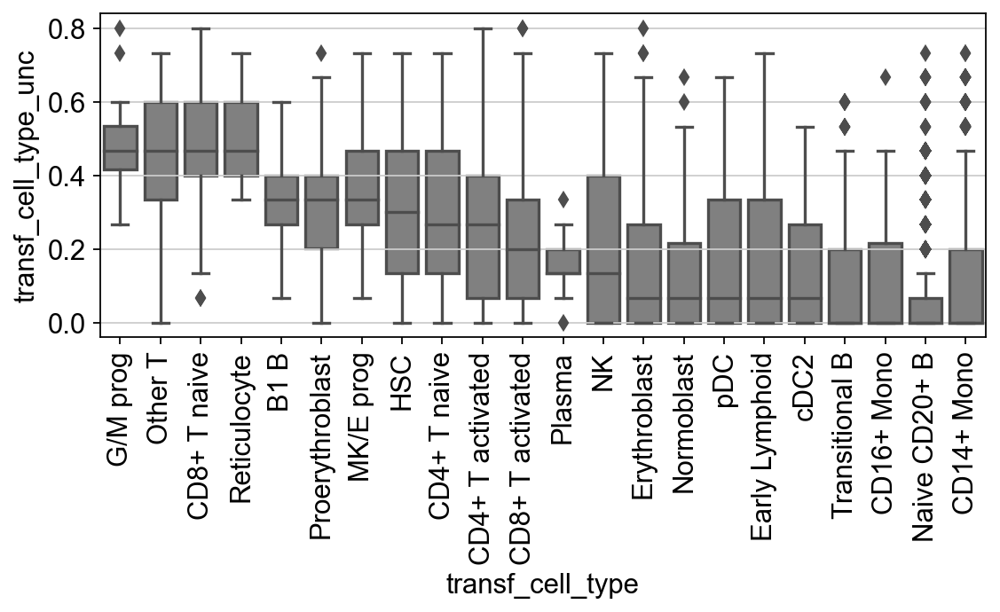

In [95]:
#  check for each cell type label how high the label transfer uncertainty levels were
#  This gives us a first impression of which annotations are more contentious/need more manual checks.
fig, ax = plt.subplots(figsize=(8, 3))
ct_order = (
    adata.obs.groupby("transf_cell_type")
    .agg({"transf_cell_type_unc": "median"})
    .sort_values(by="transf_cell_type_unc", ascending=False)
)
sns.boxplot(
    adata.obs,
    x="transf_cell_type",
    y="transf_cell_type_unc",
    color="grey",
    ax=ax,
    order=ct_order.index,
)
ax.tick_params(rotation=90, axis="x")

In [96]:
#  To incorporate this uncertainty information in our transferred labels, 
#  we can set cells with an uncertainty score above e.g. 0.2 to “unknown”:

adata.obs["transf_cell_type_certain"] = adata.obs.transf_cell_type.tolist()
adata.obs.loc[
    adata.obs.transf_cell_type_unc > 0.2, "transf_cell_type_certain"
] = "Unknown"

... storing 'transf_cell_type_certain' as categorical


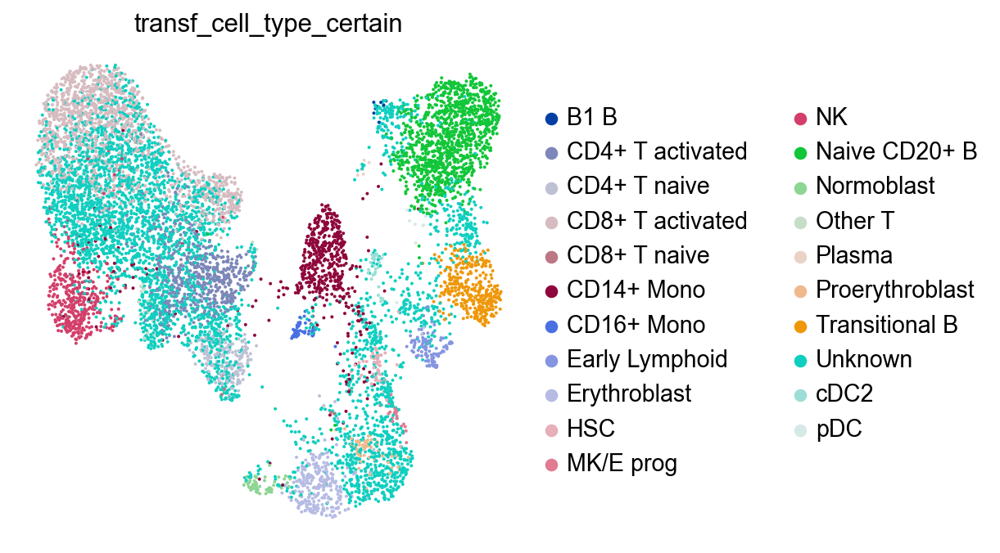

In [97]:
sc.pl.umap(adata, color="transf_cell_type_certain", frameon=False)

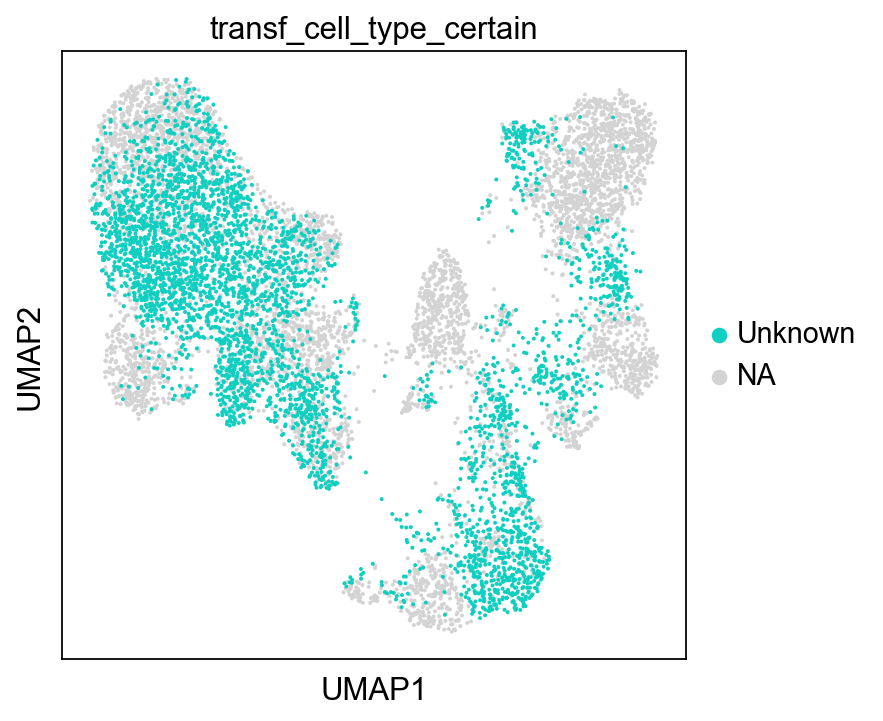

In [98]:
sc.pl.umap(adata, color="transf_cell_type_certain", groups="Unknown")

There are quite many of them! These cells will need particularly careful manual reviewing. 

However, the low-uncertainty annotations surrounding the “unknown cells” will already give us a first idea of what cell type we can expect each cell to belong to.

Now let’s take a look at our more certain annotations. We will check for a few cell types (chosen at random here) to what extent the reference-transferred annotation matches our known marker genes from above. In reality, this should be done systematically for all annotations!

In [99]:
cell_types_to_check = [
    "CD14+ Mono",
    "cDC2",
    "NK",
    "B1 B",
    "CD4+ T activated",
    "T naive",
    "MK/E prog",
]

Conveniently, for each of these cell types we have markers in our dictionary. Let’s plot marker expression for all our newly annotated cell types. You will notice that marker expression generally corresponds to the automated annotations, a good sign!

最后再用已知的marker基因来看看这些细胞的标注是否正确

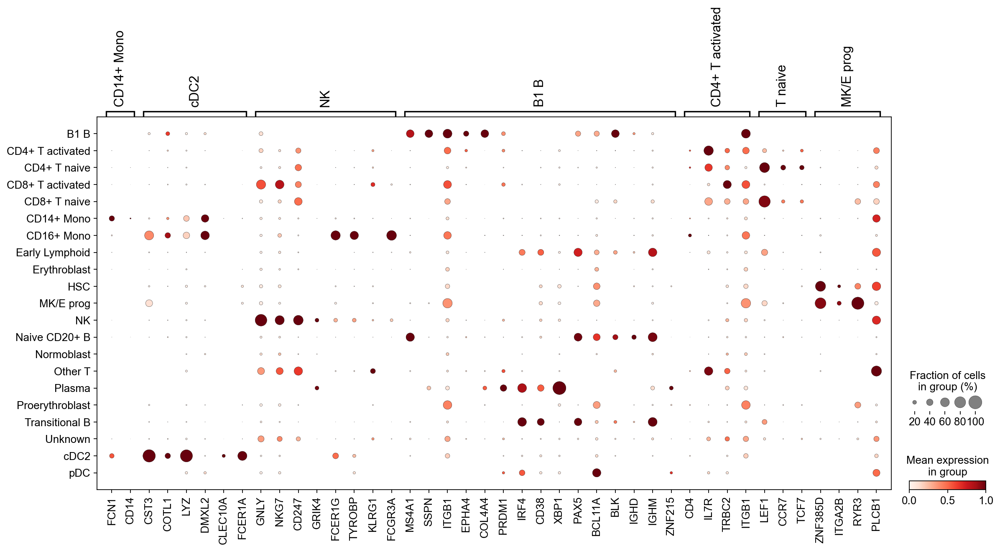

In [100]:
sc.pl.dotplot(
    adata,
    var_names={
        ct: marker_genes_in_data[ct] for ct in cell_types_to_check
    },  # gene names grouped by cell type in a dictionary
    groupby="transf_cell_type_certain",
    standard_scale="var",  # normalize gene scores from 0 to 1
)

As you can see, the marker groups are generally most highly expressed in the cells annotated with the matching label. This means these labels are likely (at least partially) correct!

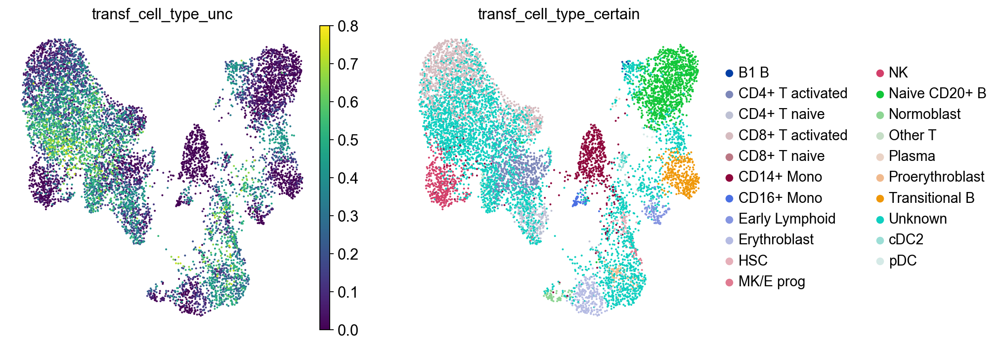

In [101]:
sc.pl.umap(
    adata, color=["transf_cell_type_unc", "transf_cell_type_certain"], frameon=False
)

For example, your reference might consist of heathly cells while your query could be from a diseased sample. The uncertainty score can then highlight disease-specific cell states, as they migh not have neighbors from the reference that consistently come from a single cell type. Especially when your reference is based on a large set of datasets, the uncertainty score is useful to flag parts of the query data that could be interesting to look into.

The quality of the transferred annotations should therefore always be validated with manual inspection using marker gene expression and refinement of the initial annotations might be needed.

In [102]:
adata.obs['transf_cell_type_unc'] = adata.obs['transf_cell_type_unc'].astype(float)

In [103]:
del adata.uns['dea_leiden_2_filtered']

In [208]:
# adata.write("./annotation_adata_out.h5ad")

In [104]:
import session_info

session_info.show()